In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [2]:

df = pd.read_csv('./Data/Real-Data/Real_Combine.csv')

In [3]:
df = df[np.isfinite(df).all(1)] ##SETTING ALL INFINETE VALUES TO 1.

In [4]:
x = df.iloc[:, :-1]
y = df.iloc[:,-1]

Train-Test and split

In [5]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 0)

## Linear Regression

In [6]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score

In [7]:
LReg = LinearRegression()
mse = cross_val_score(LReg, x_train,y_train, scoring = 'neg_mean_squared_error', cv = 5)
mean_mse = np.mean(mse)
print(mean_mse)

-3250.0863255428512


## Ridge Regression

In [8]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

In [9]:
ridge = Ridge()
parameters= {'alpha' : [1e-15, 1e-10, 1e-8, 1e-2, 1, 5, 10, 20]} # 1e-15  10^-15
RReg = GridSearchCV(ridge , parameters, scoring = 'neg_mean_squared_error', cv = 5)
RReg.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 0.01, 1, 5, 10, 20]},
             scoring='neg_mean_squared_error')

In [10]:
print(RReg.best_params_)
print(RReg.best_score_)

{'alpha': 10}
-3248.6954488780075


## Lasso Regression

In [11]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV

In [12]:
lasso = Lasso()
paramters = {'alpha' : [1e-15, 1e-10, 1e-8, 1e-2, 1, 5, 10, 20]}

LassoReg = GridSearchCV(lasso, parameters, scoring = 'neg_mean_squared_error', cv = 5)
LassoReg.fit(x_train, y_train)

C:\Users\chaud\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.767e+05, tolerance: 4.224e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\chaud\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.665e+05, tolerance: 4.336e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\chaud\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.863e+05, toleranc

GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 0.01, 1, 5, 10, 20]},
             scoring='neg_mean_squared_error')

In [13]:
print(LassoReg.best_params_)
print(LassoReg.best_score_)

{'alpha': 1}
-3244.62072677522


# Model Evaluation

In [14]:
prediction = LassoReg.predict(x_test)

C:\Users\chaud\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

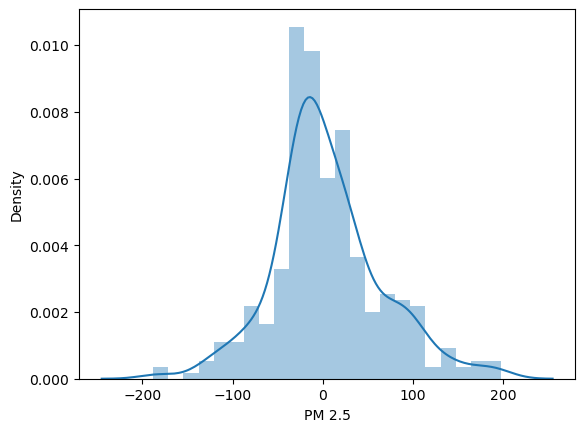

In [15]:
sns.distplot(y_test - prediction)

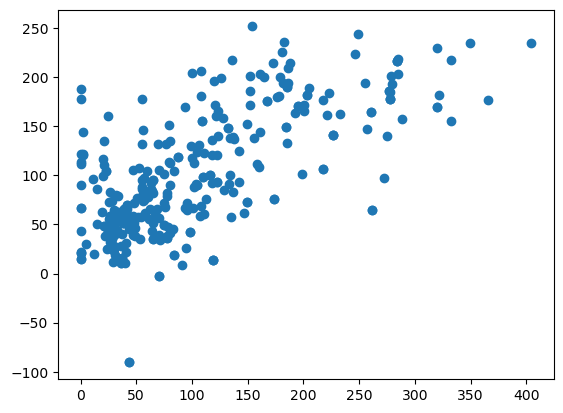

In [16]:
plt.scatter(y_test, prediction)

In [17]:
from sklearn import metrics

print('MAE =', metrics.mean_absolute_error(y_test, prediction))
print('MSE =', metrics.mean_squared_error(y_test, prediction))
print('RMSE =', np.sqrt(metrics.mean_squared_error(y_test, prediction)))

MAE = 44.872780081725665
MSE = 3680.1354270785346
RMSE = 60.66411976678253


In [18]:
#open a file, where you want to store the data
import pickle
with open('./Lasso_Regression_model', 'wb') as f:
    pickle.dump(LassoReg, f)

In [19]:
with open('./Lasso_Regression_model', 'rb') as f:
    m = pickle.load(f)

## Decision Tree Regressor

In [21]:
from sklearn.tree import DecisionTreeRegressor

In [22]:
Dtree = DecisionTreeRegressor(criterion= 'mse')

In [23]:
Dtree.fit(x_train, y_train)

C:\Users\chaud\anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


DecisionTreeRegressor(criterion='mse')

In [24]:
print('Coefficient of determination of R2 for DecisionTreeRegressor on training data is : {}'.format(Dtree.score(x_train, y_train)))

Coefficient of determination of R2 for DecisionTreeRegressor on training data is : 1.0


In [25]:
print('Coefficient of determination of R2 for DecisionTreeRegressor on test data is : {}'.format(Dtree.score(x_test, y_test)))

Coefficient of determination of R2 for DecisionTreeRegressor on test data is : 0.6544071084828653


This is the case of over fitting, as mse on training data is greater than mse on test data

In [26]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(Dtree, x, y, cv =5)

C:\Users\chaud\anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\Users\chaud\anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\Users\chaud\anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\Users\chaud\anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\Users\chaud\anaconda3\lib\site-packages\sklearn\tree\_classes.py:

In [27]:
score.mean()

0.44547252721332703

##  Tree Visualization 

In [28]:
from IPython.display import Image
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus

In [29]:
features = list(df.columns[:-1])

In [30]:
features

['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM']

In [31]:
import os

os.environ['PATH'] = os.environ['PATH'] + ';' + os.environ['CONDA_PREFIX'] + r'\Library\bin\graphviz'

In [32]:
dot_data = StringIO()
export_graphviz( Dtree, out_file = dot_data, feature_names = features, filled = True, rounded = True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.986334 to fit



## Model Evaluation


In [34]:
prediction = Dtree.predict(x_test)

C:\Users\chaud\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

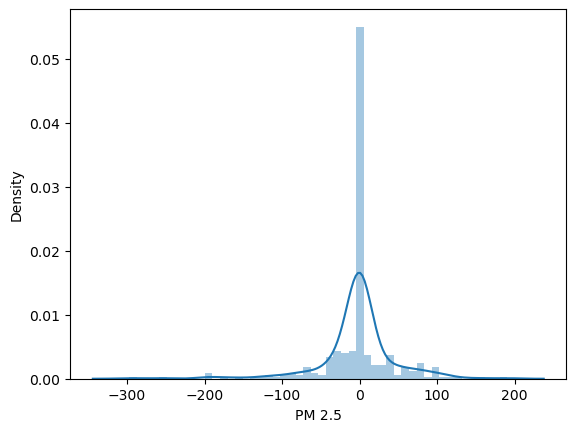

In [35]:
sns.distplot(y_test - prediction)

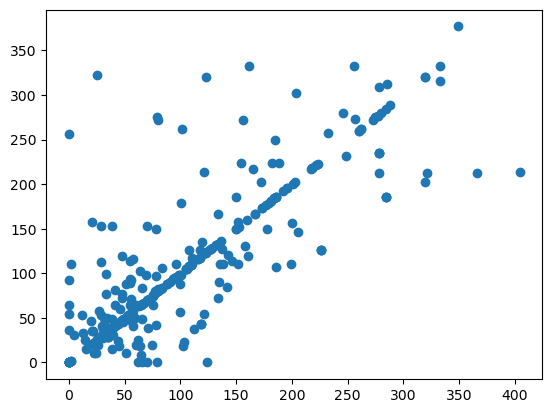

In [36]:
plt.scatter(y_test, prediction)

## HyperParamter Tunning with Decision Tree Regressor

In [37]:
DecisionTreeRegressor()

DecisionTreeRegressor()

In [45]:
# Hyper Parameter Optimization

params = {

    'splitter' : ['best' , 'random'],
    'max_depth' : [3,4,5,6,7,8,9,14,15],
    'min_samples_leaf' : [1,2,3,4,5,6],
    'min_weight_fraction_leaf' : [0.1, 0.2, 0.3, 0.4],
    'max_features' : ['auto', 'sqrt', 'log2', None],
    'max_leaf_nodes' : [None, 10, 20, 30, 40, 50, 60, 80]
                   
        }


In [46]:
from sklearn.model_selection import GridSearchCV

In [47]:
random_search = GridSearchCV(Dtree, param_grid = params, scoring = 'neg_mean_squared_error', n_jobs = -1, cv =9, verbose = 3)

In [48]:
def timer(start_time = None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, time_sec = divmod((datetime.now() - start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec, 60)
        print('\n  Time taken : {} hours {} minutes and {} seconds'.format(thour, tmin, tsec))

In [49]:
from datetime import datetime

start_time = timer(None) # time started

random_search.fit(x_train, y_train)

timer(None)

Fitting 9 folds for each of 13824 candidates, totalling 124416 fits


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


datetime.datetime(2023, 2, 19, 16, 56, 37, 938225)

In [50]:
random_search.best_params_

{'max_depth': 4,
 'max_features': None,
 'max_leaf_nodes': 30,
 'min_samples_leaf': 1,
 'min_weight_fraction_leaf': 0.1,
 'splitter': 'best'}

In [51]:
random_search.best_score_

-2954.7092776882982

In [52]:
prediction = random_search.predict(x_test)

C:\Users\chaud\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

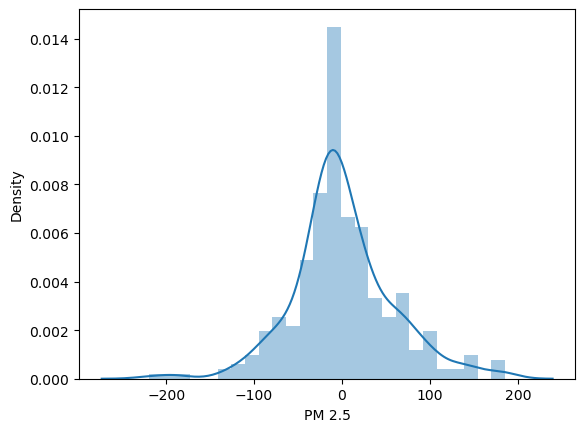

In [53]:
sns.distplot(y_test - prediction)

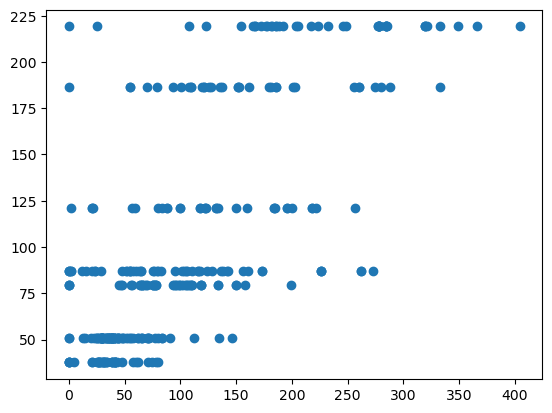

In [54]:
plt.scatter(y_test, prediction)

In [55]:
from sklearn import metrics

print('MAE =', metrics.mean_absolute_error(y_test, prediction))
print('MSE =', metrics.mean_squared_error(y_test, prediction))
print('RMSE =', np.sqrt(metrics.mean_squared_error(y_test, prediction)))

MAE = 41.29999194982836
MSE = 3294.484415172233
RMSE = 57.39759938509827


In [56]:
#open a file, where you want to store the data
import pickle
with open('./Decision_Tree_model', 'wb') as f:
    pickle.dump(random_search, f)

# Random Forest Regression

In [6]:
from sklearn.ensemble import RandomForestRegressor

In [7]:
ran_reg = RandomForestRegressor()
ran_reg.fit(x_train, y_train)

RandomForestRegressor()

In [8]:
print('Coefficient of determination of R2 for RandomForestRegresssor on training data is : {}'.format(ran_reg.score(x_train, y_train)))

Coefficient of determination of R2 for RandomForestRegresssor on training data is : 0.9741969613919524


In [9]:
print('Coefficient of determination of R2 for RandomForestRegresssor on test data is : {}'.format(ran_reg.score(x_test, y_test)))

Coefficient of determination of R2 for RandomForestRegresssor on test data is : 0.784181228705717


In [10]:
from sklearn.model_selection import cross_val_score
score =  cross_val_score(ran_reg, x_train, y_train ,cv = 5)

In [11]:
score.mean()

0.7738411401264689

## Model Evaluation

In [12]:
prediction =  ran_reg.predict(x_test)

C:\Users\chaud\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

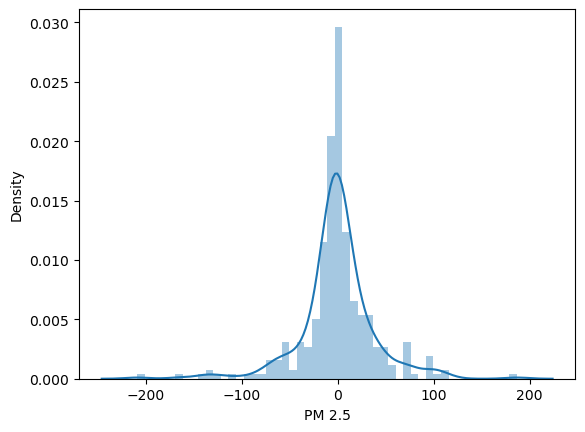

In [13]:
sns.distplot(y_test - prediction)

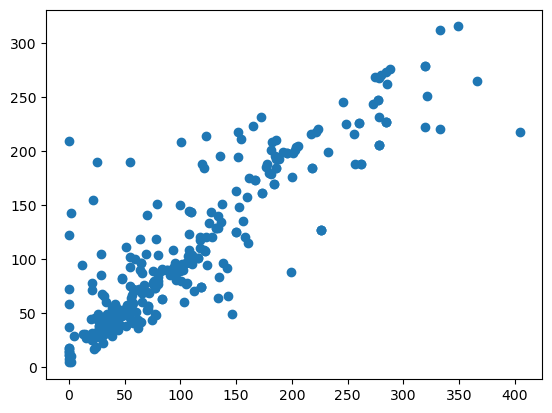

In [14]:
plt.scatter(y_test, prediction)

## Hyper Parameter Tunning

In [15]:
RandomForestRegressor()

RandomForestRegressor()

In [16]:
from sklearn.model_selection import RandomizedSearchCV

In [17]:
# Number of Trees in RandomForest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 13)]

# Number of features to be considered at each step
max_features = ['auto', 'sqrt']

# Maxmimum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 30, num = 6)]

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10, 15, 100]

# Minimum number of samples to split each leaf
max_leaf_nodes = [1, 2, 5, 10]

                                

In [18]:
ran_grid = {    
    'n_estimators' : n_estimators,
    'max_depth' : max_depth,
    'min_samples_split' : min_samples_split,
    'max_features' : max_features ,
    'max_leaf_nodes' : max_leaf_nodes
}

print(ran_grid)

{'n_estimators': [100, 191, 283, 375, 466, 558, 650, 741, 833, 925, 1016, 1108, 1200], 'max_depth': [5, 10, 15, 20, 25, 30], 'min_samples_split': [2, 5, 10, 15, 100], 'max_features': ['auto', 'sqrt'], 'max_leaf_nodes': [1, 2, 5, 10]}


In [19]:
ran_forest = RandomForestRegressor()

In [20]:
ran_forest.fit(x_train, y_train)

RandomForestRegressor()

In [21]:
rf_random = RandomizedSearchCV(ran_forest, param_distributions = ran_grid, scoring = 'neg_mean_squared_error', n_iter = 100, cv =9, verbose = 2, random_state = 42)

In [22]:
rf_random.fit(x_train, y_train)

Fitting 9 folds for each of 100 candidates, totalling 900 fits
[CV] END max_depth=30, max_features=sqrt, max_leaf_nodes=1, min_samples_split=10, n_estimators=1200; total time=   0.4s
[CV] END max_depth=30, max_features=sqrt, max_leaf_nodes=1, min_samples_split=10, n_estimators=1200; total time=   0.4s
[CV] END max_depth=30, max_features=sqrt, max_leaf_nodes=1, min_samples_split=10, n_estimators=1200; total time=   0.4s
[CV] END max_depth=30, max_features=sqrt, max_leaf_nodes=1, min_samples_split=10, n_estimators=1200; total time=   0.4s
[CV] END max_depth=30, max_features=sqrt, max_leaf_nodes=1, min_samples_split=10, n_estimators=1200; total time=   0.4s
[CV] END max_depth=30, max_features=sqrt, max_leaf_nodes=1, min_samples_split=10, n_estimators=1200; total time=   0.4s
[CV] END max_depth=30, max_features=sqrt, max_leaf_nodes=1, min_samples_split=10, n_estimators=1200; total time=   0.4s
[CV] END max_depth=30, max_features=sqrt, max_leaf_nodes=1, min_samples_split=10, n_estimators=12

[CV] END max_depth=30, max_features=sqrt, max_leaf_nodes=5, min_samples_split=5, n_estimators=191; total time=   0.2s
[CV] END max_depth=30, max_features=sqrt, max_leaf_nodes=5, min_samples_split=5, n_estimators=191; total time=   0.2s
[CV] END max_depth=30, max_features=sqrt, max_leaf_nodes=5, min_samples_split=5, n_estimators=191; total time=   0.2s
[CV] END max_depth=30, max_features=sqrt, max_leaf_nodes=2, min_samples_split=5, n_estimators=650; total time=   0.8s
[CV] END max_depth=30, max_features=sqrt, max_leaf_nodes=2, min_samples_split=5, n_estimators=650; total time=   0.8s
[CV] END max_depth=30, max_features=sqrt, max_leaf_nodes=2, min_samples_split=5, n_estimators=650; total time=   0.8s
[CV] END max_depth=30, max_features=sqrt, max_leaf_nodes=2, min_samples_split=5, n_estimators=650; total time=   0.8s
[CV] END max_depth=30, max_features=sqrt, max_leaf_nodes=2, min_samples_split=5, n_estimators=650; total time=   0.8s
[CV] END max_depth=30, max_features=sqrt, max_leaf_nodes

[CV] END max_depth=20, max_features=auto, max_leaf_nodes=1, min_samples_split=5, n_estimators=466; total time=   0.1s
[CV] END max_depth=20, max_features=auto, max_leaf_nodes=1, min_samples_split=5, n_estimators=466; total time=   0.1s
[CV] END max_depth=20, max_features=auto, max_leaf_nodes=1, min_samples_split=5, n_estimators=466; total time=   0.1s
[CV] END max_depth=20, max_features=auto, max_leaf_nodes=1, min_samples_split=5, n_estimators=466; total time=   0.1s
[CV] END max_depth=20, max_features=auto, max_leaf_nodes=1, min_samples_split=5, n_estimators=466; total time=   0.1s
[CV] END max_depth=15, max_features=sqrt, max_leaf_nodes=1, min_samples_split=100, n_estimators=741; total time=   0.2s
[CV] END max_depth=15, max_features=sqrt, max_leaf_nodes=1, min_samples_split=100, n_estimators=741; total time=   0.2s
[CV] END max_depth=15, max_features=sqrt, max_leaf_nodes=1, min_samples_split=100, n_estimators=741; total time=   0.2s
[CV] END max_depth=15, max_features=sqrt, max_leaf

[CV] END max_depth=5, max_features=auto, max_leaf_nodes=1, min_samples_split=5, n_estimators=466; total time=   0.1s
[CV] END max_depth=5, max_features=auto, max_leaf_nodes=1, min_samples_split=5, n_estimators=466; total time=   0.1s
[CV] END max_depth=5, max_features=auto, max_leaf_nodes=1, min_samples_split=5, n_estimators=466; total time=   0.1s
[CV] END max_depth=5, max_features=auto, max_leaf_nodes=1, min_samples_split=5, n_estimators=466; total time=   0.1s
[CV] END max_depth=5, max_features=auto, max_leaf_nodes=1, min_samples_split=5, n_estimators=466; total time=   0.1s
[CV] END max_depth=5, max_features=auto, max_leaf_nodes=1, min_samples_split=5, n_estimators=466; total time=   0.1s
[CV] END max_depth=5, max_features=auto, max_leaf_nodes=1, min_samples_split=5, n_estimators=466; total time=   0.1s
[CV] END max_depth=25, max_features=sqrt, max_leaf_nodes=10, min_samples_split=100, n_estimators=100; total time=   0.0s
[CV] END max_depth=25, max_features=sqrt, max_leaf_nodes=10,

[CV] END max_depth=20, max_features=auto, max_leaf_nodes=5, min_samples_split=10, n_estimators=1016; total time=   1.7s
[CV] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_split=15, n_estimators=466; total time=   0.9s
[CV] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_split=15, n_estimators=466; total time=   0.8s
[CV] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_split=15, n_estimators=466; total time=   0.8s
[CV] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_split=15, n_estimators=466; total time=   0.8s
[CV] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_split=15, n_estimators=466; total time=   0.8s
[CV] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_split=15, n_estimators=466; total time=   0.8s
[CV] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_split=15, n_estimators=466; total time=   0.8s
[CV] END max_depth=15, max_features=auto

[CV] END max_depth=20, max_features=sqrt, max_leaf_nodes=1, min_samples_split=100, n_estimators=833; total time=   0.2s
[CV] END max_depth=20, max_features=sqrt, max_leaf_nodes=1, min_samples_split=100, n_estimators=833; total time=   0.2s
[CV] END max_depth=20, max_features=sqrt, max_leaf_nodes=1, min_samples_split=100, n_estimators=833; total time=   0.2s
[CV] END max_depth=20, max_features=sqrt, max_leaf_nodes=1, min_samples_split=100, n_estimators=833; total time=   0.3s
[CV] END max_depth=5, max_features=auto, max_leaf_nodes=5, min_samples_split=2, n_estimators=925; total time=   1.5s
[CV] END max_depth=5, max_features=auto, max_leaf_nodes=5, min_samples_split=2, n_estimators=925; total time=   1.5s
[CV] END max_depth=5, max_features=auto, max_leaf_nodes=5, min_samples_split=2, n_estimators=925; total time=   1.5s
[CV] END max_depth=5, max_features=auto, max_leaf_nodes=5, min_samples_split=2, n_estimators=925; total time=   1.5s
[CV] END max_depth=5, max_features=auto, max_leaf_no

[CV] END max_depth=5, max_features=auto, max_leaf_nodes=5, min_samples_split=2, n_estimators=466; total time=   0.9s
[CV] END max_depth=5, max_features=auto, max_leaf_nodes=5, min_samples_split=2, n_estimators=466; total time=   0.8s
[CV] END max_depth=5, max_features=auto, max_leaf_nodes=5, min_samples_split=2, n_estimators=466; total time=   0.8s
[CV] END max_depth=5, max_features=auto, max_leaf_nodes=5, min_samples_split=2, n_estimators=466; total time=   0.7s
[CV] END max_depth=5, max_features=auto, max_leaf_nodes=5, min_samples_split=2, n_estimators=466; total time=   0.7s
[CV] END max_depth=5, max_features=auto, max_leaf_nodes=5, min_samples_split=2, n_estimators=466; total time=   0.7s
[CV] END max_depth=10, max_features=auto, max_leaf_nodes=2, min_samples_split=10, n_estimators=191; total time=   0.2s
[CV] END max_depth=10, max_features=auto, max_leaf_nodes=2, min_samples_split=10, n_estimators=191; total time=   0.2s
[CV] END max_depth=10, max_features=auto, max_leaf_nodes=2, 

[CV] END max_depth=30, max_features=auto, max_leaf_nodes=5, min_samples_split=15, n_estimators=375; total time=   0.6s
[CV] END max_depth=30, max_features=auto, max_leaf_nodes=5, min_samples_split=15, n_estimators=375; total time=   0.6s
[CV] END max_depth=30, max_features=auto, max_leaf_nodes=5, min_samples_split=15, n_estimators=375; total time=   0.6s
[CV] END max_depth=30, max_features=auto, max_leaf_nodes=5, min_samples_split=15, n_estimators=375; total time=   0.6s
[CV] END max_depth=30, max_features=auto, max_leaf_nodes=5, min_samples_split=15, n_estimators=375; total time=   0.6s
[CV] END max_depth=30, max_features=auto, max_leaf_nodes=5, min_samples_split=15, n_estimators=375; total time=   0.6s
[CV] END max_depth=30, max_features=auto, max_leaf_nodes=5, min_samples_split=15, n_estimators=375; total time=   0.6s
[CV] END max_depth=30, max_features=auto, max_leaf_nodes=5, min_samples_split=15, n_estimators=375; total time=   0.6s
[CV] END max_depth=30, max_features=auto, max_le

[CV] END max_depth=20, max_features=sqrt, max_leaf_nodes=2, min_samples_split=5, n_estimators=466; total time=   0.5s
[CV] END max_depth=20, max_features=sqrt, max_leaf_nodes=2, min_samples_split=5, n_estimators=466; total time=   0.6s
[CV] END max_depth=20, max_features=sqrt, max_leaf_nodes=2, min_samples_split=5, n_estimators=466; total time=   0.6s
[CV] END max_depth=10, max_features=auto, max_leaf_nodes=1, min_samples_split=2, n_estimators=1200; total time=   0.4s
[CV] END max_depth=10, max_features=auto, max_leaf_nodes=1, min_samples_split=2, n_estimators=1200; total time=   0.4s
[CV] END max_depth=10, max_features=auto, max_leaf_nodes=1, min_samples_split=2, n_estimators=1200; total time=   0.4s
[CV] END max_depth=10, max_features=auto, max_leaf_nodes=1, min_samples_split=2, n_estimators=1200; total time=   0.4s
[CV] END max_depth=10, max_features=auto, max_leaf_nodes=1, min_samples_split=2, n_estimators=1200; total time=   0.4s
[CV] END max_depth=10, max_features=auto, max_leaf_

[CV] END max_depth=15, max_features=auto, max_leaf_nodes=5, min_samples_split=100, n_estimators=466; total time=   1.2s
[CV] END max_depth=15, max_features=auto, max_leaf_nodes=5, min_samples_split=100, n_estimators=466; total time=   1.9s
[CV] END max_depth=15, max_features=auto, max_leaf_nodes=5, min_samples_split=100, n_estimators=466; total time=   0.8s
[CV] END max_depth=15, max_features=auto, max_leaf_nodes=5, min_samples_split=100, n_estimators=466; total time=   0.7s
[CV] END max_depth=15, max_features=auto, max_leaf_nodes=5, min_samples_split=100, n_estimators=466; total time=   0.8s
[CV] END max_depth=15, max_features=auto, max_leaf_nodes=5, min_samples_split=100, n_estimators=466; total time=   0.8s
[CV] END max_depth=30, max_features=auto, max_leaf_nodes=5, min_samples_split=10, n_estimators=466; total time=   1.7s
[CV] END max_depth=30, max_features=auto, max_leaf_nodes=5, min_samples_split=10, n_estimators=466; total time=   1.1s
[CV] END max_depth=30, max_features=auto, 

[CV] END max_depth=25, max_features=sqrt, max_leaf_nodes=2, min_samples_split=2, n_estimators=833; total time=   1.3s
[CV] END max_depth=25, max_features=sqrt, max_leaf_nodes=2, min_samples_split=2, n_estimators=833; total time=   1.3s
[CV] END max_depth=25, max_features=sqrt, max_leaf_nodes=2, min_samples_split=2, n_estimators=833; total time=   1.2s
[CV] END max_depth=25, max_features=sqrt, max_leaf_nodes=2, min_samples_split=2, n_estimators=833; total time=   1.1s
[CV] END max_depth=25, max_features=sqrt, max_leaf_nodes=2, min_samples_split=2, n_estimators=833; total time=   1.2s
[CV] END max_depth=25, max_features=sqrt, max_leaf_nodes=2, min_samples_split=2, n_estimators=833; total time=   1.2s
[CV] END max_depth=25, max_features=sqrt, max_leaf_nodes=2, min_samples_split=2, n_estimators=833; total time=   1.1s
[CV] END max_depth=25, max_features=sqrt, max_leaf_nodes=2, min_samples_split=2, n_estimators=833; total time=   1.1s
[CV] END max_depth=25, max_features=sqrt, max_leaf_nodes

[CV] END max_depth=25, max_features=sqrt, max_leaf_nodes=10, min_samples_split=100, n_estimators=283; total time=   0.3s
[CV] END max_depth=25, max_features=sqrt, max_leaf_nodes=10, min_samples_split=100, n_estimators=283; total time=   0.3s
[CV] END max_depth=25, max_features=sqrt, max_leaf_nodes=10, min_samples_split=100, n_estimators=283; total time=   0.3s
[CV] END max_depth=10, max_features=auto, max_leaf_nodes=1, min_samples_split=15, n_estimators=650; total time=   0.2s
[CV] END max_depth=10, max_features=auto, max_leaf_nodes=1, min_samples_split=15, n_estimators=650; total time=   0.2s
[CV] END max_depth=10, max_features=auto, max_leaf_nodes=1, min_samples_split=15, n_estimators=650; total time=   0.2s
[CV] END max_depth=10, max_features=auto, max_leaf_nodes=1, min_samples_split=15, n_estimators=650; total time=   0.2s
[CV] END max_depth=10, max_features=auto, max_leaf_nodes=1, min_samples_split=15, n_estimators=650; total time=   0.2s
[CV] END max_depth=10, max_features=auto, 

[CV] END max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_samples_split=2, n_estimators=558; total time=   1.0s
[CV] END max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_samples_split=2, n_estimators=558; total time=   1.0s
[CV] END max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_samples_split=2, n_estimators=558; total time=   0.9s
[CV] END max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_samples_split=2, n_estimators=558; total time=   0.8s
[CV] END max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_samples_split=2, n_estimators=558; total time=   0.7s
[CV] END max_depth=20, max_features=sqrt, max_leaf_nodes=10, min_samples_split=2, n_estimators=558; total time=   0.8s
[CV] END max_depth=15, max_features=auto, max_leaf_nodes=1, min_samples_split=10, n_estimators=925; total time=   0.4s
[CV] END max_depth=15, max_features=auto, max_leaf_nodes=1, min_samples_split=10, n_estimators=925; total time=   0.4s
[CV] END max_depth=15, max_features=auto, max_le

C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
234 fits failed out of a total of 900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
234 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 450, in fit
    trees = Parallel(
  File "C:\Users\chaud\anaconda3\lib\site-packages\joblib\parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\chaud\anaconda3\lib\site-packages

RandomizedSearchCV(cv=9, estimator=RandomForestRegressor(), n_iter=100,
                   param_distributions={'max_depth': [5, 10, 15, 20, 25, 30],
                                        'max_features': ['auto', 'sqrt'],
                                        'max_leaf_nodes': [1, 2, 5, 10],
                                        'min_samples_split': [2, 5, 10, 15,
                                                              100],
                                        'n_estimators': [100, 191, 283, 375,
                                                         466, 558, 650, 741,
                                                         833, 925, 1016, 1108,
                                                         1200]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=2)

In [23]:
rf_random.best_params_

{'n_estimators': 1200,
 'min_samples_split': 15,
 'max_leaf_nodes': 10,
 'max_features': 'auto',
 'max_depth': 5}

In [24]:
rf_random.best_score_

-2456.8032199816153

C:\Users\chaud\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

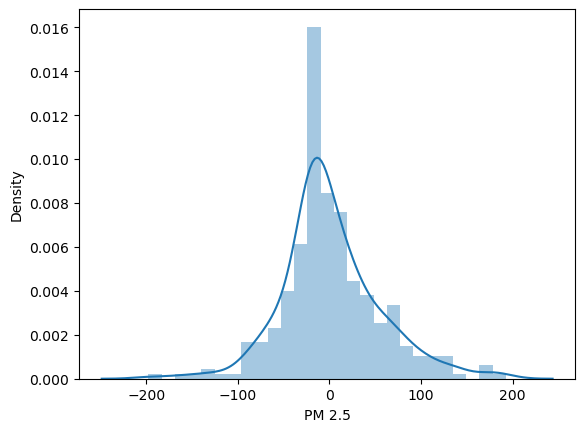

In [25]:
prediction = rf_random.predict(x_test)

sns.distplot(y_test - prediction)

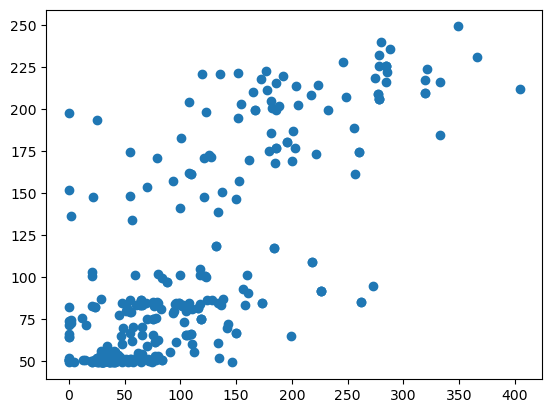

In [26]:
plt.scatter(y_test , prediction)

In [27]:
from sklearn import metrics

print('MAE =', metrics.mean_absolute_error(y_test, prediction))
print('MSE =', metrics.mean_squared_error(y_test, prediction))
print('RMSE =', np.sqrt(metrics.mean_squared_error(y_test, prediction)))

MAE = 39.38938823509923
MSE = 2918.5039641207845
RMSE = 54.02317987790782


In [28]:
#open a file, where you want to store the data
import pickle
with open('./RandomForest_model', 'wb') as f:
    pickle.dump(rf_random, f)

## XGBoost Regressor

In [29]:
import xgboost as xgb

In [30]:
xg_reg = xgb.XGBRegressor()

xg_reg.fit(x_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [31]:
print('Coefficient of determination of R2 for XGBtRegresssor on training data is : {}'.format(xg_reg.score(x_train, y_train)))

Coefficient of determination of R2 for XGBtRegresssor on training data is : 0.9997717196345083


In [34]:
print('Coefficient of determination of R2 for XGBtRegresssor on test data is : {}'.format(xg_reg.score(x_test, y_test)))

Coefficient of determination of R2 for XGBtRegresssor on test data is : 0.8123312908288712


In [35]:
from sklearn.model_selection import cross_val_score

score = cross_val_score(xg_reg, x_train, y_train, cv = 5)

## Model Evaluation

In [37]:
prediction = xg_reg.predict(x_test)

C:\Users\chaud\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

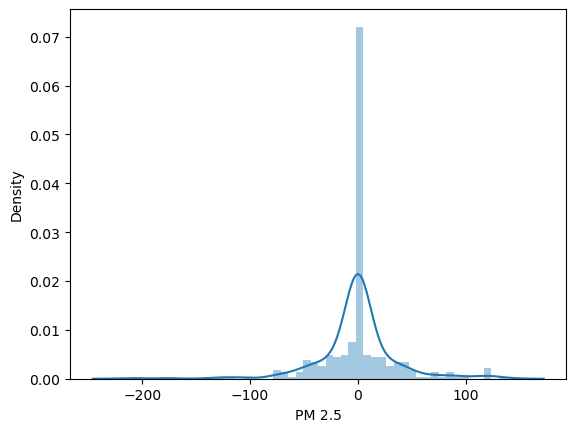

In [38]:
sns.distplot(y_test - prediction)

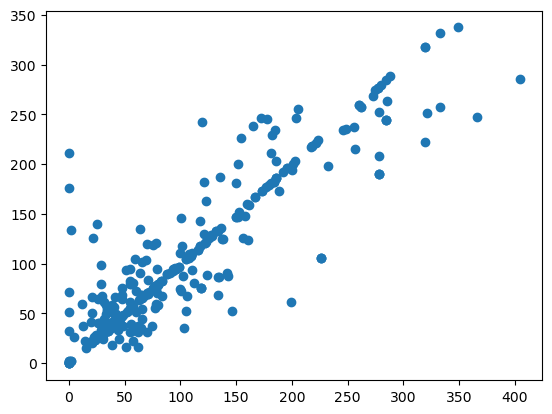

In [39]:
plt.scatter(y_test, prediction)

## Hyper Prameter Training 

In [40]:
xgb.XGBRFRegressor()

XGBRFRegressor(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bytree=None,
               early_stopping_rounds=None, enable_categorical=False,
               eval_metric=None, feature_types=None, gamma=None, gpu_id=None,
               grow_policy=None, importance_type=None,
               interaction_constraints=None, max_bin=None,
               max_cat_threshold=None, max_cat_to_onehot=None,
               max_delta_step=None, max_depth=None, max_leaves=None,
               min_child_weight=None, missing=nan, monotone_constraints=None,
               n_estimators=100, n_jobs=None, num_parallel_tree=None,
               objective='reg:squarederror', predictor=None, random_state=None,
               reg_alpha=None, ...)

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

In [42]:
# Number of Trees in RandomForest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 13)]

# Number of features to be considered at each step
learning_rate = ['0.05', '0.1', '0.2', '0.3', '0.5', '07']

# Maxmimum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 30, num = 6)]

# Minimum number of samples required to split a node
subsample = [0.7, 0.6, 0.8]

# Minimum number of samples to split each leaf
min_child_weight = [3, 4, 5, 6, 7]

                                

In [43]:
xg_grid = {    
    'n_estimators' : n_estimators,
    'learning_rate' : learning_rate,
    'max_depth' : max_depth,
    'subsample' : subsample ,
    'min_child_weight' : min_child_weight
}

print(xg_grid)

{'n_estimators': [100, 191, 283, 375, 466, 558, 650, 741, 833, 925, 1016, 1108, 1200], 'learning_rate': ['0.05', '0.1', '0.2', '0.3', '0.5', '07'], 'max_depth': [5, 10, 15, 20, 25, 30], 'subsample': [0.7, 0.6, 0.8], 'min_child_weight': [3, 4, 5, 6, 7]}


In [44]:
xgb_reg = xgb.XGBRegressor()

In [46]:
xgb_random = RandomizedSearchCV(xgb_reg, param_distributions = xg_grid, scoring = 'neg_mean_squared_error', n_iter = 100, cv =9, verbose = 2, random_state = 42, n_jobs = 1)

In [47]:
xgb_random.fit(x_train, y_train)

Fitting 9 folds for each of 100 candidates, totalling 900 fits
[CV] END learning_rate=0.3, max_depth=15, min_child_weight=3, n_estimators=375, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.3, max_depth=15, min_child_weight=3, n_estimators=375, subsample=0.7; total time=   0.7s
[CV] END learning_rate=0.3, max_depth=15, min_child_weight=3, n_estimators=375, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.3, max_depth=15, min_child_weight=3, n_estimators=375, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.3, max_depth=15, min_child_weight=3, n_estimators=375, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.3, max_depth=15, min_child_weight=3, n_estimators=375, subsample=0.7; total time=   0.4s
[CV] END learning_rate=0.3, max_depth=15, min_child_weight=3, n_estimators=375, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.3, max_depth=15, min_child_weight=3, n_estimators=375, subsample=0.7; total time=   0.4s
[CV] END learning_rate=0.

[CV] END learning_rate=0.1, max_depth=15, min_child_weight=3, n_estimators=283, subsample=0.7; total time=   0.4s
[CV] END learning_rate=0.1, max_depth=15, min_child_weight=3, n_estimators=283, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.1, max_depth=15, min_child_weight=3, n_estimators=283, subsample=0.7; total time=   0.4s
[CV] END learning_rate=0.1, max_depth=15, min_child_weight=3, n_estimators=283, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.1, max_depth=15, min_child_weight=3, n_estimators=283, subsample=0.7; total time=   0.4s
[CV] END learning_rate=0.1, max_depth=15, min_child_weight=3, n_estimators=283, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.1, max_depth=15, min_child_weight=3, n_estimators=283, subsample=0.7; total time=   0.4s
[CV] END learning_rate=0.1, max_depth=15, min_child_weight=3, n_estimators=283, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.1, max_depth=15, min_child_weight=3, n_estimators=283, subsampl

[CV] END learning_rate=0.5, max_depth=20, min_child_weight=4, n_estimators=466, subsample=0.6; total time=   0.6s
[CV] END learning_rate=0.5, max_depth=20, min_child_weight=4, n_estimators=466, subsample=0.6; total time=   0.7s
[CV] END learning_rate=0.5, max_depth=20, min_child_weight=4, n_estimators=466, subsample=0.6; total time=   0.7s
[CV] END learning_rate=0.5, max_depth=20, min_child_weight=4, n_estimators=466, subsample=0.6; total time=   0.6s
[CV] END learning_rate=0.5, max_depth=20, min_child_weight=4, n_estimators=466, subsample=0.6; total time=   0.5s
[CV] END learning_rate=0.5, max_depth=20, min_child_weight=4, n_estimators=466, subsample=0.6; total time=   0.6s
[CV] END learning_rate=0.5, max_depth=20, min_child_weight=4, n_estimators=466, subsample=0.6; total time=   0.8s
[CV] END learning_rate=0.5, max_depth=20, min_child_weight=4, n_estimators=466, subsample=0.6; total time=   0.5s
[CV] END learning_rate=0.5, max_depth=20, min_child_weight=4, n_estimators=466, subsampl

C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=10, min_child_weight=4, n_estimators=1200, subsample=0.6; total time=   0.5s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=10, min_child_weight=4, n_estimators=1200, subsample=0.6; total time=   0.5s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=10, min_child_weight=4, n_estimators=1200, subsample=0.6; total time=   0.5s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=10, min_child_weight=4, n_estimators=1200, subsample=0.6; total time=   0.5s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=10, min_child_weight=4, n_estimators=1200, subsample=0.6; total time=   0.5s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=10, min_child_weight=4, n_estimators=1200, subsample=0.6; total time=   0.5s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=10, min_child_weight=4, n_estimators=1200, subsample=0.6; total time=   0.5s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=10, min_child_weight=4, n_estimators=1200, subsample=0.6; total time=   0.5s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=10, min_child_weight=4, n_estimators=1200, subsample=0.6; total time=   0.5s
[CV] END learning_rate=0.3, max_depth=20, min_child_weight=4, n_estimators=650, subsample=0.8; total time=   0.6s
[CV] END learning_rate=0.3, max_depth=20, min_child_weight=4, n_estimators=650, subsample=0.8; total time=   1.0s
[CV] END learning_rate=0.3, max_depth=20, min_child_weight=4, n_estimators=650, subsample=0.8; total time=   0.6s
[CV] END learning_rate=0.3, max_depth=20, min_child_weight=4, n_estimators=650, subsample=0.8; total time=   0.7s
[CV] END learning_rate=0.3, max_depth=20, min_child_weight=4, n_estimators=650, subsample=0.8; total time=   1.0s
[CV] END learning_rate=0.3, max_depth=20, min_child_weight=4, n_estimators=650, subsample=0.8; total time=   0.9s
[CV] END learning_rate=0.3, max_depth=20, min_child_weight=4, n_estimators=650, subsample=0.8; total time=   1.0s
[CV] END learning_rate=0.3, max_depth=20, min_child_weight=4, n_estimators=650, subsampl

C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=10, min_child_weight=7, n_estimators=925, subsample=0.6; total time=   0.4s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=10, min_child_weight=7, n_estimators=925, subsample=0.6; total time=   0.3s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=10, min_child_weight=7, n_estimators=925, subsample=0.6; total time=   0.3s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=10, min_child_weight=7, n_estimators=925, subsample=0.6; total time=   0.3s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=10, min_child_weight=7, n_estimators=925, subsample=0.6; total time=   0.3s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=10, min_child_weight=7, n_estimators=925, subsample=0.6; total time=   0.4s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=10, min_child_weight=7, n_estimators=925, subsample=0.6; total time=   0.4s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=10, min_child_weight=7, n_estimators=925, subsample=0.6; total time=   0.4s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=10, min_child_weight=7, n_estimators=925, subsample=0.6; total time=   0.4s
[CV] END learning_rate=0.3, max_depth=10, min_child_weight=4, n_estimators=650, subsample=0.8; total time=   0.5s
[CV] END learning_rate=0.3, max_depth=10, min_child_weight=4, n_estimators=650, subsample=0.8; total time=   0.4s
[CV] END learning_rate=0.3, max_depth=10, min_child_weight=4, n_estimators=650, subsample=0.8; total time=   0.5s
[CV] END learning_rate=0.3, max_depth=10, min_child_weight=4, n_estimators=650, subsample=0.8; total time=   0.5s
[CV] END learning_rate=0.3, max_depth=10, min_child_weight=4, n_estimators=650, subsample=0.8; total time=   0.7s
[CV] END learning_rate=0.3, max_depth=10, min_child_weight=4, n_estimators=650, subsample=0.8; total time=   0.5s
[CV] END learning_rate=0.3, max_depth=10, min_child_weight=4, n_estimators=650, subsample=0.8; total time=   0.7s
[CV] END learning_rate=0.3, max_depth=10, min_child_weight=4, n_estimators=650, subsample

C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=6, n_estimators=1200, subsample=0.8; total time=   0.5s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=6, n_estimators=1200, subsample=0.8; total time=   0.5s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=6, n_estimators=1200, subsample=0.8; total time=   0.5s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=6, n_estimators=1200, subsample=0.8; total time=   0.5s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=6, n_estimators=1200, subsample=0.8; total time=   0.5s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=6, n_estimators=1200, subsample=0.8; total time=   0.5s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=6, n_estimators=1200, subsample=0.8; total time=   0.5s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=6, n_estimators=1200, subsample=0.8; total time=   0.5s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=6, n_estimators=1200, subsample=0.8; total time=   0.5s
[CV] END learning_rate=0.2, max_depth=25, min_child_weight=5, n_estimators=283, subsample=0.8; total time=   0.5s
[CV] END learning_rate=0.2, max_depth=25, min_child_weight=5, n_estimators=283, subsample=0.8; total time=   0.4s
[CV] END learning_rate=0.2, max_depth=25, min_child_weight=5, n_estimators=283, subsample=0.8; total time=   0.5s
[CV] END learning_rate=0.2, max_depth=25, min_child_weight=5, n_estimators=283, subsample=0.8; total time=   0.5s
[CV] END learning_rate=0.2, max_depth=25, min_child_weight=5, n_estimators=283, subsample=0.8; total time=   0.6s
[CV] END learning_rate=0.2, max_depth=25, min_child_weight=5, n_estimators=283, subsample=0.8; total time=   0.5s
[CV] END learning_rate=0.2, max_depth=25, min_child_weight=5, n_estimators=283, subsample=0.8; total time=   0.5s
[CV] END learning_rate=0.2, max_depth=25, min_child_weight=5, n_estimators=283, subsample

C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=25, min_child_weight=5, n_estimators=1108, subsample=0.8; total time=   0.5s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=25, min_child_weight=5, n_estimators=1108, subsample=0.8; total time=   0.5s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=25, min_child_weight=5, n_estimators=1108, subsample=0.8; total time=   0.5s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=25, min_child_weight=5, n_estimators=1108, subsample=0.8; total time=   0.4s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=25, min_child_weight=5, n_estimators=1108, subsample=0.8; total time=   0.4s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=25, min_child_weight=5, n_estimators=1108, subsample=0.8; total time=   0.5s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=25, min_child_weight=5, n_estimators=1108, subsample=0.8; total time=   0.8s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=25, min_child_weight=5, n_estimators=1108, subsample=0.8; total time=   0.6s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=25, min_child_weight=5, n_estimators=1108, subsample=0.8; total time=   0.5s
[CV] END learning_rate=0.5, max_depth=15, min_child_weight=3, n_estimators=375, subsample=0.8; total time=   0.4s
[CV] END learning_rate=0.5, max_depth=15, min_child_weight=3, n_estimators=375, subsample=0.8; total time=   0.4s
[CV] END learning_rate=0.5, max_depth=15, min_child_weight=3, n_estimators=375, subsample=0.8; total time=   0.4s
[CV] END learning_rate=0.5, max_depth=15, min_child_weight=3, n_estimators=375, subsample=0.8; total time=   0.3s
[CV] END learning_rate=0.5, max_depth=15, min_child_weight=3, n_estimators=375, subsample=0.8; total time=   0.4s
[CV] END learning_rate=0.5, max_depth=15, min_child_weight=3, n_estimators=375, subsample=0.8; total time=   0.3s
[CV] END learning_rate=0.5, max_depth=15, min_child_weight=3, n_estimators=375, subsample=0.8; total time=   0.3s
[CV] END learning_rate=0.5, max_depth=15, min_child_weight=3, n_estimators=375, subsampl

[CV] END learning_rate=0.5, max_depth=20, min_child_weight=5, n_estimators=650, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.2, max_depth=5, min_child_weight=7, n_estimators=741, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.2, max_depth=5, min_child_weight=7, n_estimators=741, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.2, max_depth=5, min_child_weight=7, n_estimators=741, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.2, max_depth=5, min_child_weight=7, n_estimators=741, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.2, max_depth=5, min_child_weight=7, n_estimators=741, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.2, max_depth=5, min_child_weight=7, n_estimators=741, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.2, max_depth=5, min_child_weight=7, n_estimators=741, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.2, max_depth=5, min_child_weight=7, n_estimators=741, subsample=0.7; t

[CV] END learning_rate=0.05, max_depth=25, min_child_weight=5, n_estimators=283, subsample=0.6; total time=   0.4s
[CV] END learning_rate=0.5, max_depth=30, min_child_weight=5, n_estimators=100, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.5, max_depth=30, min_child_weight=5, n_estimators=100, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.5, max_depth=30, min_child_weight=5, n_estimators=100, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.5, max_depth=30, min_child_weight=5, n_estimators=100, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.5, max_depth=30, min_child_weight=5, n_estimators=100, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.5, max_depth=30, min_child_weight=5, n_estimators=100, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.5, max_depth=30, min_child_weight=5, n_estimators=100, subsample=0.7; total time=   0.1s
[CV] END learning_rate=0.5, max_depth=30, min_child_weight=5, n_estimators=100, subsamp

[CV] END learning_rate=0.5, max_depth=10, min_child_weight=5, n_estimators=1108, subsample=0.8; total time=   0.6s
[CV] END learning_rate=0.05, max_depth=10, min_child_weight=3, n_estimators=741, subsample=0.6; total time=   0.9s
[CV] END learning_rate=0.05, max_depth=10, min_child_weight=3, n_estimators=741, subsample=0.6; total time=   0.9s
[CV] END learning_rate=0.05, max_depth=10, min_child_weight=3, n_estimators=741, subsample=0.6; total time=   0.9s
[CV] END learning_rate=0.05, max_depth=10, min_child_weight=3, n_estimators=741, subsample=0.6; total time=   0.9s
[CV] END learning_rate=0.05, max_depth=10, min_child_weight=3, n_estimators=741, subsample=0.6; total time=   0.9s
[CV] END learning_rate=0.05, max_depth=10, min_child_weight=3, n_estimators=741, subsample=0.6; total time=   1.0s
[CV] END learning_rate=0.05, max_depth=10, min_child_weight=3, n_estimators=741, subsample=0.6; total time=   0.9s
[CV] END learning_rate=0.05, max_depth=10, min_child_weight=3, n_estimators=741,

[CV] END learning_rate=0.2, max_depth=30, min_child_weight=6, n_estimators=1108, subsample=0.8; total time=   1.3s
[CV] END learning_rate=0.05, max_depth=25, min_child_weight=4, n_estimators=741, subsample=0.8; total time=   1.5s
[CV] END learning_rate=0.05, max_depth=25, min_child_weight=4, n_estimators=741, subsample=0.8; total time=   1.6s
[CV] END learning_rate=0.05, max_depth=25, min_child_weight=4, n_estimators=741, subsample=0.8; total time=   1.8s
[CV] END learning_rate=0.05, max_depth=25, min_child_weight=4, n_estimators=741, subsample=0.8; total time=   1.5s
[CV] END learning_rate=0.05, max_depth=25, min_child_weight=4, n_estimators=741, subsample=0.8; total time=   1.5s
[CV] END learning_rate=0.05, max_depth=25, min_child_weight=4, n_estimators=741, subsample=0.8; total time=   1.5s
[CV] END learning_rate=0.05, max_depth=25, min_child_weight=4, n_estimators=741, subsample=0.8; total time=   1.5s
[CV] END learning_rate=0.05, max_depth=25, min_child_weight=4, n_estimators=741,

[CV] END learning_rate=0.1, max_depth=5, min_child_weight=6, n_estimators=1016, subsample=0.7; total time=   0.8s
[CV] END learning_rate=0.1, max_depth=30, min_child_weight=4, n_estimators=466, subsample=0.6; total time=   0.8s
[CV] END learning_rate=0.1, max_depth=30, min_child_weight=4, n_estimators=466, subsample=0.6; total time=   1.0s
[CV] END learning_rate=0.1, max_depth=30, min_child_weight=4, n_estimators=466, subsample=0.6; total time=   0.8s
[CV] END learning_rate=0.1, max_depth=30, min_child_weight=4, n_estimators=466, subsample=0.6; total time=   0.9s
[CV] END learning_rate=0.1, max_depth=30, min_child_weight=4, n_estimators=466, subsample=0.6; total time=   0.8s
[CV] END learning_rate=0.1, max_depth=30, min_child_weight=4, n_estimators=466, subsample=0.6; total time=   0.8s
[CV] END learning_rate=0.1, max_depth=30, min_child_weight=4, n_estimators=466, subsample=0.6; total time=   0.8s
[CV] END learning_rate=0.1, max_depth=30, min_child_weight=4, n_estimators=466, subsampl

C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=10, min_child_weight=6, n_estimators=283, subsample=0.6; total time=   0.1s
[CV] END learning_rate=07, max_depth=10, min_child_weight=6, n_estimators=283, subsample=0.6; total time=   0.0s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=10, min_child_weight=6, n_estimators=283, subsample=0.6; total time=   0.1s
[CV] END learning_rate=07, max_depth=10, min_child_weight=6, n_estimators=283, subsample=0.6; total time=   0.1s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=10, min_child_weight=6, n_estimators=283, subsample=0.6; total time=   0.1s
[CV] END learning_rate=07, max_depth=10, min_child_weight=6, n_estimators=283, subsample=0.6; total time=   0.1s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=10, min_child_weight=6, n_estimators=283, subsample=0.6; total time=   0.0s
[CV] END learning_rate=07, max_depth=10, min_child_weight=6, n_estimators=283, subsample=0.6; total time=   0.1s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=0.05, max_depth=10, min_child_weight=3, n_estimators=1200, subsample=0.8; total time=   1.7s
[CV] END learning_rate=0.05, max_depth=10, min_child_weight=3, n_estimators=1200, subsample=0.8; total time=   1.7s
[CV] END learning_rate=0.05, max_depth=10, min_child_weight=3, n_estimators=1200, subsample=0.8; total time=   1.7s
[CV] END learning_rate=0.05, max_depth=10, min_child_weight=3, n_estimators=1200, subsample=0.8; total time=   1.6s
[CV] END learning_rate=0.05, max_depth=10, min_child_weight=3, n_estimators=1200, subsample=0.8; total time=   1.6s
[CV] END learning_rate=0.05, max_depth=10, min_child_weight=3, n_estimators=1200, subsample=0.8; total time=   1.7s
[CV] END learning_rate=0.05, max_depth=10, min_child_weight=3, n_estimators=1200, subsample=0.8; total time=   1.6s
[CV] END learning_rate=0.05, max_depth=10, min_child_weight=3, n_estimators=1200, subsample=0.8; total time=   1.7s
[CV] END learning_rate=0.05, max_depth=10, min_child_weight=3, n_estimat

C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=15, min_child_weight=6, n_estimators=191, subsample=0.6; total time=   0.0s
[CV] END learning_rate=07, max_depth=15, min_child_weight=6, n_estimators=191, subsample=0.6; total time=   0.0s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=15, min_child_weight=6, n_estimators=191, subsample=0.6; total time=   0.0s
[CV] END learning_rate=07, max_depth=15, min_child_weight=6, n_estimators=191, subsample=0.6; total time=   0.0s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=15, min_child_weight=6, n_estimators=191, subsample=0.6; total time=   0.0s
[CV] END learning_rate=07, max_depth=15, min_child_weight=6, n_estimators=191, subsample=0.6; total time=   0.0s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=15, min_child_weight=6, n_estimators=191, subsample=0.6; total time=   0.0s
[CV] END learning_rate=07, max_depth=15, min_child_weight=6, n_estimators=191, subsample=0.6; total time=   0.0s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=0.3, max_depth=20, min_child_weight=6, n_estimators=375, subsample=0.7; total time=   0.6s
[CV] END learning_rate=0.3, max_depth=20, min_child_weight=6, n_estimators=375, subsample=0.7; total time=   0.6s
[CV] END learning_rate=0.3, max_depth=20, min_child_weight=6, n_estimators=375, subsample=0.7; total time=   0.6s
[CV] END learning_rate=0.3, max_depth=20, min_child_weight=6, n_estimators=375, subsample=0.7; total time=   0.6s
[CV] END learning_rate=0.3, max_depth=20, min_child_weight=6, n_estimators=375, subsample=0.7; total time=   0.6s
[CV] END learning_rate=0.3, max_depth=20, min_child_weight=6, n_estimators=375, subsample=0.7; total time=   0.6s
[CV] END learning_rate=0.3, max_depth=20, min_child_weight=6, n_estimators=375, subsample=0.7; total time=   0.6s
[CV] END learning_rate=0.3, max_depth=20, min_child_weight=6, n_estimators=375, subsample=0.7; total time=   0.6s
[CV] END learning_rate=0.3, max_depth=20, min_child_weight=6, n_estimators=375, subsampl

C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=4, n_estimators=741, subsample=0.8; total time=   0.3s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=4, n_estimators=741, subsample=0.8; total time=   0.2s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=4, n_estimators=741, subsample=0.8; total time=   0.2s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=4, n_estimators=741, subsample=0.8; total time=   0.3s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=4, n_estimators=741, subsample=0.8; total time=   0.3s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=4, n_estimators=741, subsample=0.8; total time=   0.3s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=4, n_estimators=741, subsample=0.8; total time=   0.3s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=4, n_estimators=741, subsample=0.8; total time=   0.3s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=4, n_estimators=741, subsample=0.8; total time=   0.3s
[CV] END learning_rate=0.2, max_depth=5, min_child_weight=4, n_estimators=466, subsample=0.6; total time=   0.3s
[CV] END learning_rate=0.2, max_depth=5, min_child_weight=4, n_estimators=466, subsample=0.6; total time=   0.3s
[CV] END learning_rate=0.2, max_depth=5, min_child_weight=4, n_estimators=466, subsample=0.6; total time=   0.3s
[CV] END learning_rate=0.2, max_depth=5, min_child_weight=4, n_estimators=466, subsample=0.6; total time=   0.3s
[CV] END learning_rate=0.2, max_depth=5, min_child_weight=4, n_estimators=466, subsample=0.6; total time=   0.3s
[CV] END learning_rate=0.2, max_depth=5, min_child_weight=4, n_estimators=466, subsample=0.6; total time=   0.3s
[CV] END learning_rate=0.2, max_depth=5, min_child_weight=4, n_estimators=466, subsample=0.6; total time=   0.3s
[CV] END learning_rate=0.2, max_depth=5, min_child_weight=4, n_estimators=466, subsample=0.6; tot

C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=20, min_child_weight=5, n_estimators=1108, subsample=0.6; total time=   0.4s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=20, min_child_weight=5, n_estimators=1108, subsample=0.6; total time=   0.4s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=20, min_child_weight=5, n_estimators=1108, subsample=0.6; total time=   0.4s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=20, min_child_weight=5, n_estimators=1108, subsample=0.6; total time=   0.4s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=20, min_child_weight=5, n_estimators=1108, subsample=0.6; total time=   0.4s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=20, min_child_weight=5, n_estimators=1108, subsample=0.6; total time=   0.4s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=20, min_child_weight=5, n_estimators=1108, subsample=0.6; total time=   0.4s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=20, min_child_weight=5, n_estimators=1108, subsample=0.6; total time=   0.4s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=20, min_child_weight=5, n_estimators=1108, subsample=0.6; total time=   0.4s
[CV] END learning_rate=0.2, max_depth=25, min_child_weight=5, n_estimators=558, subsample=0.6; total time=   0.9s
[CV] END learning_rate=0.2, max_depth=25, min_child_weight=5, n_estimators=558, subsample=0.6; total time=   0.9s
[CV] END learning_rate=0.2, max_depth=25, min_child_weight=5, n_estimators=558, subsample=0.6; total time=   0.9s
[CV] END learning_rate=0.2, max_depth=25, min_child_weight=5, n_estimators=558, subsample=0.6; total time=   1.0s
[CV] END learning_rate=0.2, max_depth=25, min_child_weight=5, n_estimators=558, subsample=0.6; total time=   1.0s
[CV] END learning_rate=0.2, max_depth=25, min_child_weight=5, n_estimators=558, subsample=0.6; total time=   0.9s
[CV] END learning_rate=0.2, max_depth=25, min_child_weight=5, n_estimators=558, subsample=0.6; total time=   0.9s
[CV] END learning_rate=0.2, max_depth=25, min_child_weight=5, n_estimators=558, subsampl

C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=7, n_estimators=1108, subsample=0.6; total time=   0.4s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=7, n_estimators=1108, subsample=0.6; total time=   0.4s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=7, n_estimators=1108, subsample=0.6; total time=   0.4s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=7, n_estimators=1108, subsample=0.6; total time=   0.4s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=7, n_estimators=1108, subsample=0.6; total time=   0.4s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=7, n_estimators=1108, subsample=0.6; total time=   0.4s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=7, n_estimators=1108, subsample=0.6; total time=   0.4s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=7, n_estimators=1108, subsample=0.6; total time=   0.4s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=5, min_child_weight=7, n_estimators=1108, subsample=0.6; total time=   0.4s
[CV] END learning_rate=0.1, max_depth=25, min_child_weight=5, n_estimators=558, subsample=0.8; total time=   1.0s
[CV] END learning_rate=0.1, max_depth=25, min_child_weight=5, n_estimators=558, subsample=0.8; total time=   1.1s
[CV] END learning_rate=0.1, max_depth=25, min_child_weight=5, n_estimators=558, subsample=0.8; total time=   1.0s
[CV] END learning_rate=0.1, max_depth=25, min_child_weight=5, n_estimators=558, subsample=0.8; total time=   1.0s
[CV] END learning_rate=0.1, max_depth=25, min_child_weight=5, n_estimators=558, subsample=0.8; total time=   1.1s
[CV] END learning_rate=0.1, max_depth=25, min_child_weight=5, n_estimators=558, subsample=0.8; total time=   1.0s
[CV] END learning_rate=0.1, max_depth=25, min_child_weight=5, n_estimators=558, subsample=0.8; total time=   1.1s
[CV] END learning_rate=0.1, max_depth=25, min_child_weight=5, n_estimators=558, subsample

C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=20, min_child_weight=5, n_estimators=650, subsample=0.6; total time=   0.2s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=20, min_child_weight=5, n_estimators=650, subsample=0.6; total time=   0.2s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=20, min_child_weight=5, n_estimators=650, subsample=0.6; total time=   0.2s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=20, min_child_weight=5, n_estimators=650, subsample=0.6; total time=   0.2s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=20, min_child_weight=5, n_estimators=650, subsample=0.6; total time=   0.2s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=20, min_child_weight=5, n_estimators=650, subsample=0.6; total time=   0.2s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=20, min_child_weight=5, n_estimators=650, subsample=0.6; total time=   0.2s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=20, min_child_weight=5, n_estimators=650, subsample=0.6; total time=   0.2s


C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 438, in mean_squared_error
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
  File "C:\Users\chaud\anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 96, in _check_reg_targets
    y_pr

[CV] END learning_rate=07, max_depth=20, min_child_weight=5, n_estimators=650, subsample=0.6; total time=   0.2s
[CV] END learning_rate=0.1, max_depth=5, min_child_weight=4, n_estimators=1108, subsample=0.7; total time=   0.9s
[CV] END learning_rate=0.1, max_depth=5, min_child_weight=4, n_estimators=1108, subsample=0.7; total time=   0.9s
[CV] END learning_rate=0.1, max_depth=5, min_child_weight=4, n_estimators=1108, subsample=0.7; total time=   0.9s
[CV] END learning_rate=0.1, max_depth=5, min_child_weight=4, n_estimators=1108, subsample=0.7; total time=   0.9s
[CV] END learning_rate=0.1, max_depth=5, min_child_weight=4, n_estimators=1108, subsample=0.7; total time=   0.9s
[CV] END learning_rate=0.1, max_depth=5, min_child_weight=4, n_estimators=1108, subsample=0.7; total time=   1.0s
[CV] END learning_rate=0.1, max_depth=5, min_child_weight=4, n_estimators=1108, subsample=0.7; total time=   0.9s
[CV] END learning_rate=0.1, max_depth=5, min_child_weight=4, n_estimators=1108, subsample

C:\Users\chaud\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:969: UserWarning: One or more of the test scores are non-finite: [-1442.48181976 -1423.37569516 -1492.09721391 -1532.92360325
 -1640.82462445 -1653.40189343 -1422.99131817 -1468.08314768
 -1422.92223731 -1418.55305574 -1639.86836404 -2072.71695804
 -1399.06800216 -1886.19446955 -1435.76906428 -1514.08713678
 -1857.32260546 -1547.29089876            nan -1466.21380146
 -1864.20472503 -1393.76598756 -1705.53205281 -1398.74055041
 -1469.53432113            nan -1532.92507406 -1699.09102716
 -1466.8517371             nan -1500.51982473 -1596.09413135
            nan -1705.60059548 -1747.1575712  -1431.1274509
 -1424.15535854 -1560.21247293 -1447.2916951  -1446.97363349
 -1782.14156099 -1527.25083183 -1515.78262862 -1736.97031534
 -1634.27326174 -1952.98812968 -1717.41441197 -1386.46722868
 -1435.02760894 -1774.67254417 -1516.28895628 -1387.50278365
 -1561.64632071 -1480.53557892 -1518.11624125 -1549.3456941
 -160

RandomizedSearchCV(cv=9,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, gpu_id=None,
                                          grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=...
                                          predictor=None, random_state=None, ...),
                   n_ite

In [48]:
xgb_random.best_params_

{'subsample': 0.6,
 'n_estimators': 741,
 'min_child_weight': 3,
 'max_depth': 10,
 'learning_rate': '0.05'}

In [51]:
xgb_random.best_score_

-1317.1938006636838

In [54]:
prediction = xgb_random.predict(x_test)

C:\Users\chaud\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

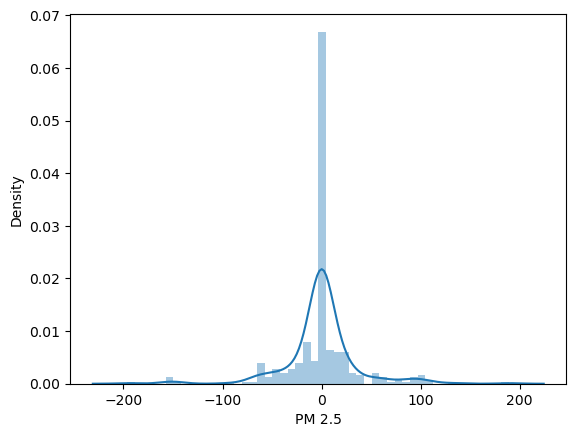

In [55]:
sns.distplot(y_test - prediction)

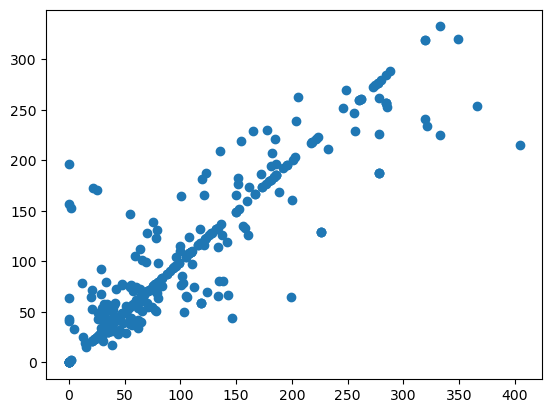

In [56]:
plt.scatter(y_test, prediction)

In [57]:
from sklearn import metrics

print('MAE =', metrics.mean_absolute_error(y_test, prediction))
print('MSE =', metrics.mean_squared_error(y_test, prediction))
print('RMSE =', np.sqrt(metrics.mean_squared_error(y_test, prediction)))

MAE = 18.861137677613282
MSE = 1373.046062376566
RMSE = 37.05463617924977


In [108]:
#open a file, where you want to store the data
import pickle
with open('./XGBoostRegressor_model', 'wb') as f:
    pickle.dump(xgb_random, f)

# KNN Regressor

In [59]:
from sklearn.neighbors import KNeighborsRegressor

In [74]:
knn_reg = KNeighborsRegressor(n_neighbors = 1)

In [75]:
knn_reg.fit(x_train, y_train)

KNeighborsRegressor(n_neighbors=1)

In [80]:
print('Coefficient of determination of R2 for KNNRegresssor on training data is : {}'.format(knn_reg.score(x_train, y_train)))

Coefficient of determination of R2 for KNNRegresssor on training data is : 1.0


In [81]:
print('Coefficient of determination of R2 for KNNRegresssor on test data is : {}'.format(knn_reg.score(x_test, y_test)))

Coefficient of determination of R2 for KNNRegresssor on test data is : 0.5417545333477789


In [82]:
from sklearn.model_selection import cross_val_score

score = cross_val_score(knn_reg, x_train, y_train, cv = 5)

In [83]:
score.mean()

0.4512566986142896

## Model Evaluation

In [86]:
prediction = knn_reg.predict(x_test)

C:\Users\chaud\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

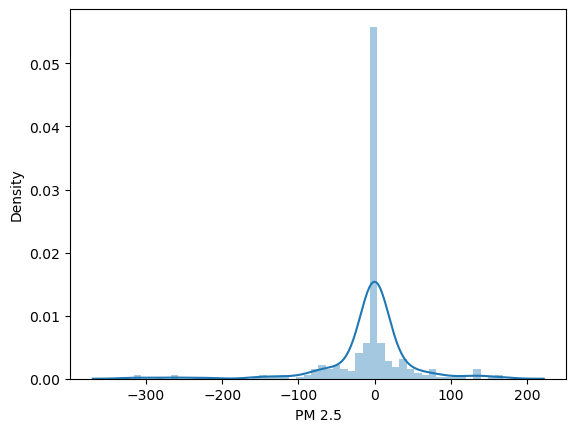

In [88]:
sns.distplot(y_test - prediction)

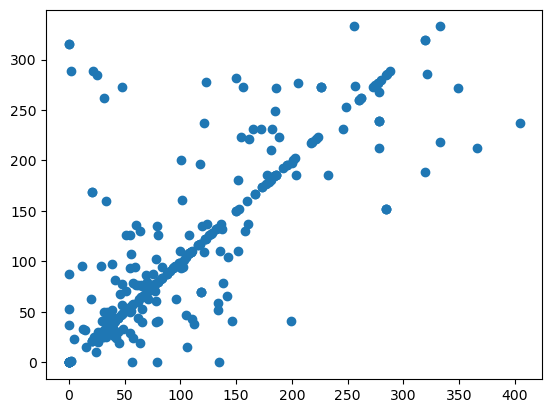

In [89]:
plt.scatter(y_test, prediction)

## Hyper Parameter Tunning


In [98]:
accuracy_rate =[]

for i in range(1, 40):
    
    knn = KNeighborsRegressor(n_neighbors = i)
    score = cross_val_score(knn, x_train, y_train, cv = 10, scoring = 'neg_mean_squared_error')
    accuracy_rate.append(score.mean())

Text(0, 0.5, 'Accuracy Rate')

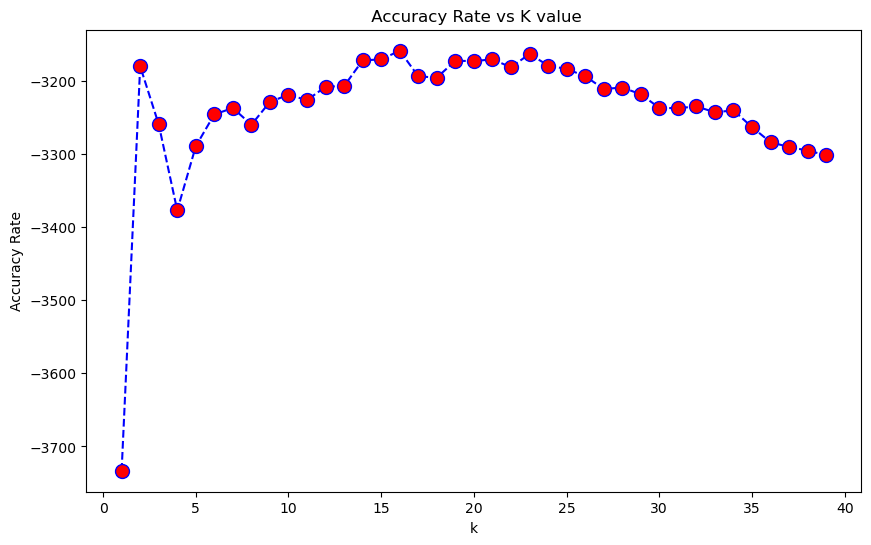

In [99]:
plt.figure(figsize = (10,6))

plt.plot(range(1, 40), accuracy_rate, color = 'blue', linestyle = 'dashed', 
         marker = 'o', markerfacecolor = 'red', markersize = 10)

plt.title(' Accuracy Rate vs K value')
plt.xlabel('k')
plt.ylabel('Accuracy Rate')

In [109]:
knn = KNeighborsRegressor(n_neighbors = 1)

knn.fit(x_train, y_train)

prediction = knn.predict(x_test)

C:\Users\chaud\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

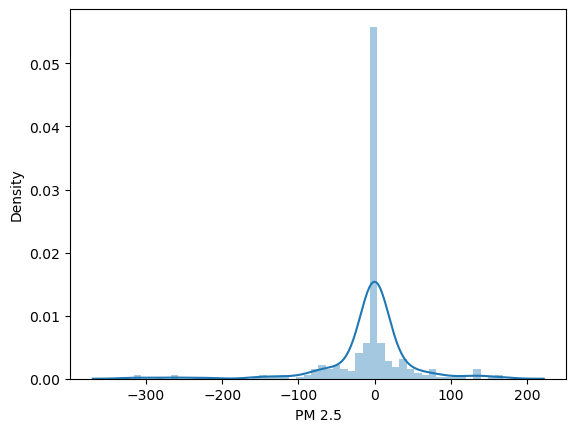

In [110]:
sns.distplot(y_test - prediction)

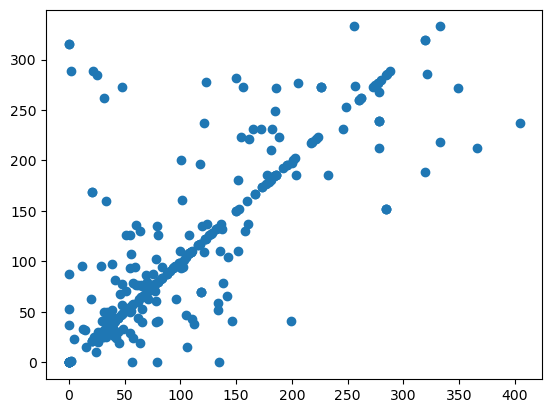

In [111]:
plt.scatter(y_test, prediction)

In [112]:
from sklearn import metrics

print('MAE =', metrics.mean_absolute_error(y_test, prediction))
print('MSE =', metrics.mean_squared_error(y_test, prediction))
print('RMSE =', np.sqrt(metrics.mean_squared_error(y_test, prediction)))

MAE = 26.46491361788618
MSE = 3282.779510713076
RMSE = 57.295545295538254


In [106]:
knn = KNeighborsRegressor(n_neighbors = 15)

knn.fit(x_train, y_train)

prediction = knn.predict(x_test)

In [107]:
from sklearn import metrics

print('MAE =', metrics.mean_absolute_error(y_test, prediction))
print('MSE =', metrics.mean_squared_error(y_test, prediction))
print('RMSE =', np.sqrt(metrics.mean_squared_error(y_test, prediction)))

MAE = 41.978786415989156
MSE = 3506.5235091757468
RMSE = 59.215905879887934


In [113]:
#open a file, where you want to store the data
import pickle
with open('./KNNRegressor_model', 'wb') as f:
    pickle.dump(knn, f)

# Artificial Neural Network

In [118]:
pip install tensorflow

In [121]:
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LeakyReLU, PReLU, ELU
from keras.layers import Dropout

In [127]:
# Building model archeticture
nn_model = Sequential()

# input layer

nn_model.add(Dense(128, kernel_initializer = 'normal', input_dim = x_train.shape[1]))

# middle layer

nn_model.add(Dense(256, kernel_initializer = 'normal', activation = 'relu'))
nn_model.add(Dense(256, kernel_initializer = 'normal', activation = 'relu'))
nn_model.add(Dense(256, kernel_initializer = 'normal', activation = 'relu'))

# output layer

nn_model.add(Dense(1, kernel_initializer = 'normal', activation = 'linear'))



# compile the network

nn_model.compile(loss = 'mean_absolute_error', optimizer = 'adam', metrics = ['mean_absolute_error'])
nn_model.summary()

# fitting the model to training data

model =  nn_model.fit(x_train, y_train, validation_split = 0.33, batch_size = 12, epochs = 100)

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_25 (Dense)            (None, 128)               1152      
                                                                 
 dense_26 (Dense)            (None, 256)               33024     
                                                                 
 dense_27 (Dense)            (None, 256)               65792     
                                                                 
 dense_28 (Dense)            (None, 256)               65792     
                                                                 
 dense_29 (Dense)            (None, 1)                 257       
                                                                 
Total params: 166,017
Trainable params: 166,017
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
43/43 [=============================

43/43 [==============================] - 0s 7ms/step - loss: 41.7628 - mean_absolute_error: 41.7628 - val_loss: 43.7151 - val_mean_absolute_error: 43.7151
Epoch 44/100
43/43 [==============================] - 0s 7ms/step - loss: 40.2721 - mean_absolute_error: 40.2721 - val_loss: 43.8378 - val_mean_absolute_error: 43.8378
Epoch 45/100
43/43 [==============================] - 0s 7ms/step - loss: 40.3314 - mean_absolute_error: 40.3314 - val_loss: 45.1366 - val_mean_absolute_error: 45.1366
Epoch 46/100
43/43 [==============================] - 0s 7ms/step - loss: 40.3177 - mean_absolute_error: 40.3177 - val_loss: 46.9730 - val_mean_absolute_error: 46.9730
Epoch 47/100
43/43 [==============================] - 0s 7ms/step - loss: 39.5586 - mean_absolute_error: 39.5586 - val_loss: 43.9435 - val_mean_absolute_error: 43.9435
Epoch 48/100
43/43 [==============================] - 0s 7ms/step - loss: 40.2517 - mean_absolute_error: 40.2517 - val_loss: 48.5275 - val_mean_absolute_error: 48.5275
Epoch

Epoch 92/100
43/43 [==============================] - 0s 8ms/step - loss: 40.3100 - mean_absolute_error: 40.3100 - val_loss: 42.8621 - val_mean_absolute_error: 42.8621
Epoch 93/100
43/43 [==============================] - 0s 6ms/step - loss: 40.6987 - mean_absolute_error: 40.6987 - val_loss: 47.8608 - val_mean_absolute_error: 47.8608
Epoch 94/100
43/43 [==============================] - 0s 6ms/step - loss: 39.7114 - mean_absolute_error: 39.7114 - val_loss: 43.6204 - val_mean_absolute_error: 43.6204
Epoch 95/100
43/43 [==============================] - 0s 6ms/step - loss: 39.2159 - mean_absolute_error: 39.2159 - val_loss: 44.3409 - val_mean_absolute_error: 44.3409
Epoch 96/100
43/43 [==============================] - 0s 6ms/step - loss: 39.1159 - mean_absolute_error: 39.1159 - val_loss: 43.2175 - val_mean_absolute_error: 43.2175
Epoch 97/100
43/43 [==============================] - 0s 7ms/step - loss: 39.5381 - mean_absolute_error: 39.5381 - val_loss: 44.5595 - val_mean_absolute_error: 

## Model Evaluation

In [128]:
prediction = nn_model.predict(x_test)

11/11 [==============================] - 0s 3ms/step


In [129]:
y_test

785    104.625000
742    125.891667
748    279.600000
986    110.416667
480     31.333333
          ...    
492     44.125000
62     142.500000
79      65.166667
300     22.333333
194      0.000000
Name: PM 2.5, Length: 328, dtype: float64

C:\Users\chaud\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

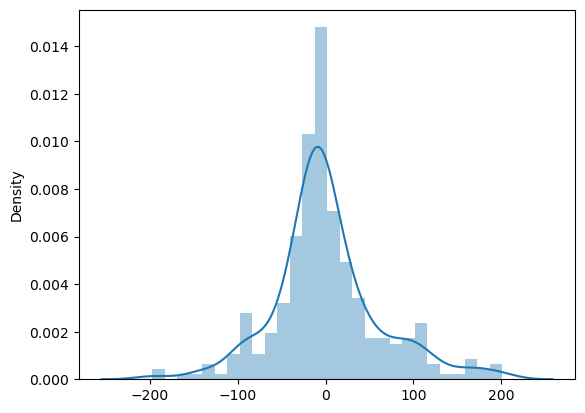

In [131]:
sns.distplot(y_test.values.reshape(-1,1) - prediction)

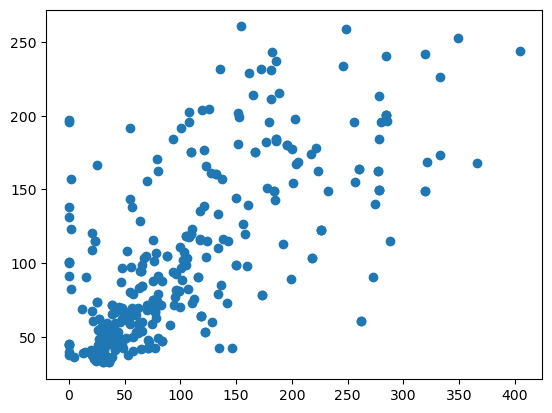

In [132]:
plt.scatter(y_test, prediction)

In [133]:
from sklearn import metrics

print('MAE =', metrics.mean_absolute_error(y_test, prediction))
print('MSE =', metrics.mean_squared_error(y_test, prediction))
print('RMSE =', np.sqrt(metrics.mean_squared_error(y_test, prediction)))

MAE = 42.357921301833976
MSE = 3728.855809732616
RMSE = 61.06435793269766
